In [1]:
!git clone https://github.com/davidDKIT/CA2_new_data.git

Cloning into 'CA2_new_data'...
remote: Enumerating objects: 52699, done.
remote: Counting objects: 100% (34448/34448), done.
remote: Compressing objects: 100% (34446/34446), done.
remote: Total 52699 (delta 0), reused 34447 (delta 0), pack-reused 18251
Receiving objects: 100% (52699/52699), 788.55 MiB | 10.03 MiB/s, done.
Updating files: 100% (34445/34445), done.


In [2]:
!ls

CA2_new_data  sample_data


In [6]:
%cd CA2_new_data

/content/CA2_new_data


In [7]:
!ls

DrivingData  README.md


In [5]:
#! usr/bin/env python3
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Dense, Convolution2D, MaxPooling2D, Dropout, Flatten
import cv2
import pandas as pd
import random
import os
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from imgaug import augmenters as iaa

In [11]:
datadir = "DrivingData"
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names=columns)
pd.set_option('display.max_colwidth', 7)

In [12]:
def path_leaf(path):
    head, tail = ntpath.split(path)
    return tail

In [13]:
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)

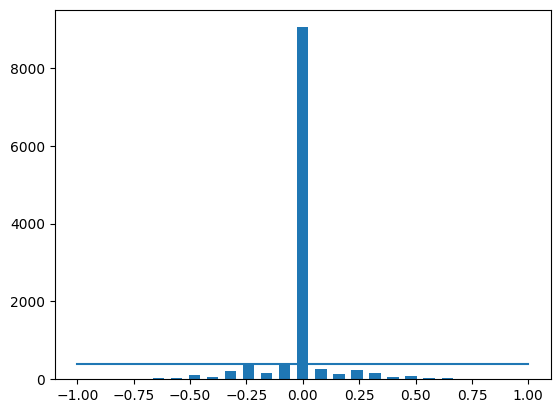

In [14]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
centre = (bins[:-1] + bins[1:])*0.5
plt.bar(centre, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(
    data['steering'])), (samples_per_bin, samples_per_bin))
plt.show()

In [15]:
remove_list = []
print("Total data: ", len(data))

for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if bins[j] <= data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)


Total data:  11481


In [16]:
print("Removed: ", len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print("Remaining: ", len(data))

Removed:  8662
Remaining:  2819


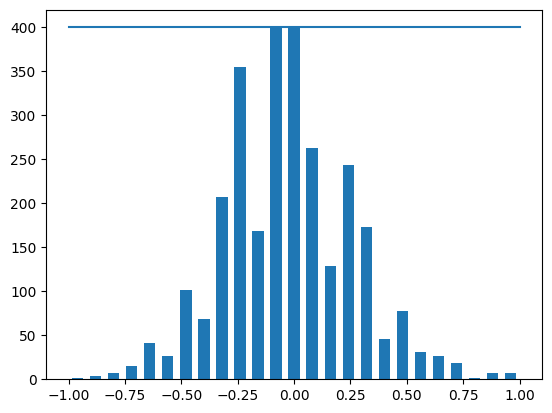

In [17]:
hist, bins = np.histogram(data['steering'], num_bins)
plt.bar(centre, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(
    data['steering'])), (samples_per_bin, samples_per_bin))
plt.show()

In [18]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    centre,left,right = indexed_data[0], indexed_data[1],indexed_data[2]
    image_path.append(os.path.join(datadir,centre.strip()))
    steering.append(float(indexed_data[3]))
    image_path.append(os.path.join(datadir, left.strip()))
    steering.append(float(indexed_data[3]) + 0.15)
    image_path.append(os.path.join(datadir, right.strip()))
    steering.append(float(indexed_data[3]) - 0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [19]:
image_paths, steerings = load_img_steering(datadir+'/IMG', data)
X_train, X_valid, y_train, y_valid = train_test_split(
    image_paths, steerings, test_size=0.2, random_state=6)
print(f"Traing samples {len(X_train)}, validation samples {len(X_valid)}")

Traing samples 6765, validation samples 1692


Text(0.5, 1.0, 'Validation set')

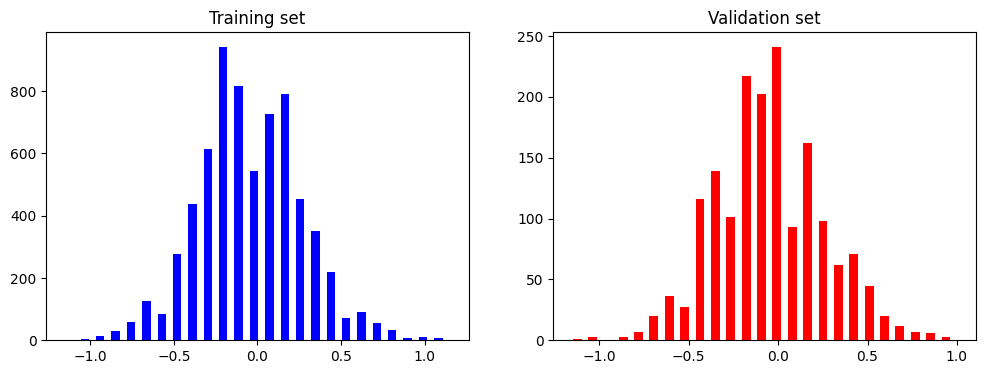

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

In [21]:
def pan(image_to_pan):
    pan_func = iaa.Affine(translate_percent={"x":(-0.1, 0.1), "y":(-0.1, 0.1)})
    pan_image = pan_func.augment_image(image_to_pan)
    return pan_image

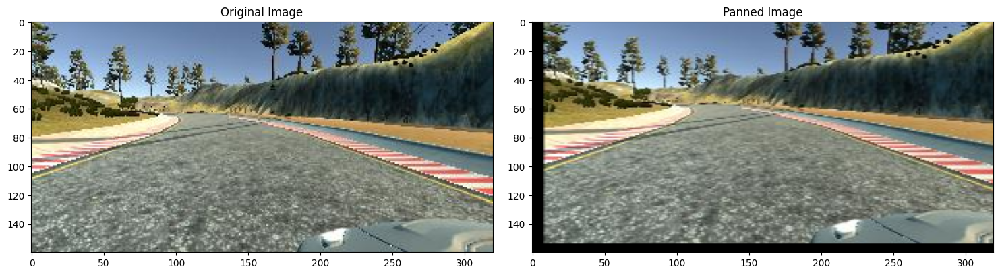

In [22]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title("Original Image")
axs[1].imshow(panned_image)
axs[1].set_title("Panned Image")
plt.show()

In [23]:
def zoom(image_to_zoom):
    zoom_func = iaa.Affine(scale=(1, 1.3))
    z_image = zoom_func.augment_image(image_to_zoom)
    return z_image

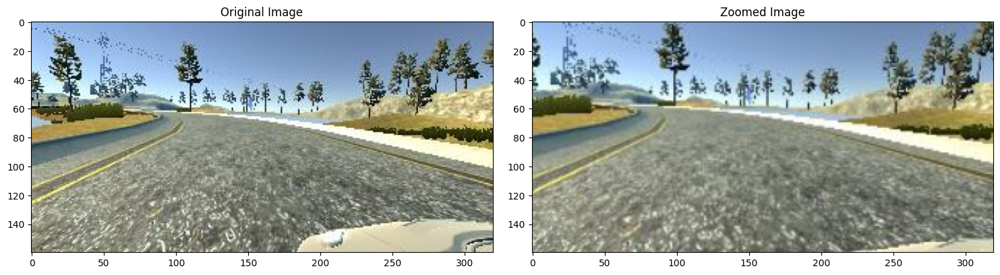

In [24]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title("Original Image")
axs[1].imshow(zoomed_image)
axs[1].set_title("Zoomed Image")
plt.show()

In [25]:
def img_random_brightness(image_to_brighten):
    bright_func = iaa.Multiply((0.2, 1.2))
    bright_image = bright_func.augment_image(image_to_brighten).astype("uint8")
    return bright_image

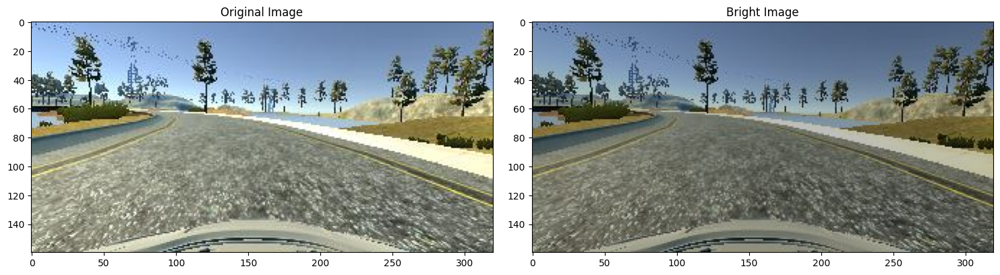

In [26]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
bright_image = img_random_brightness(original_image)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title("Original Image")
axs[1].imshow(bright_image)
axs[1].set_title("Bright Image")
plt.show()

In [27]:
def img_random_flip(image_to_flip, steering_angle):
    flipped_image = cv2.flip(image_to_flip, 1)
    steering_angle = -steering_angle
    return flipped_image, steering_angle

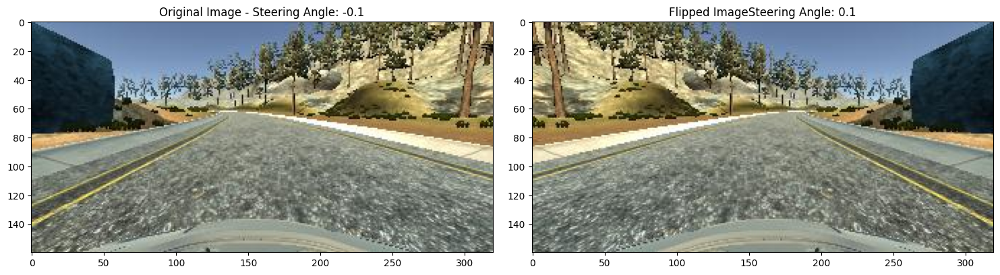

In [28]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
original_image = mpimg.imread(image)
flipped_image, flipped_angle = img_random_flip(original_image, steering_angle)
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title("Original Image - " + "Steering Angle: " + str(steering_angle))
axs[1].imshow(flipped_image)
axs[1].set_title("Flipped Image"+ "Steering Angle: " + str(flipped_angle))
plt.show()

In [29]:
def random_augment(image_to_augment, steering_angle):
    augment_image = mpimg.imread(image_to_augment)
    if np.random.rand() < 0.5:
        augment_image = zoom(augment_image)
    if np.random.rand() < 0.5:
        augment_image = pan(augment_image)
    if np.random.rand() < 0.5:
        augment_image = img_random_brightness(augment_image)
    if np.random.rand() < 0.5:
        augment_image, steering_angle = img_random_flip(augment_image, steering_angle)
    return augment_image, steering_angle

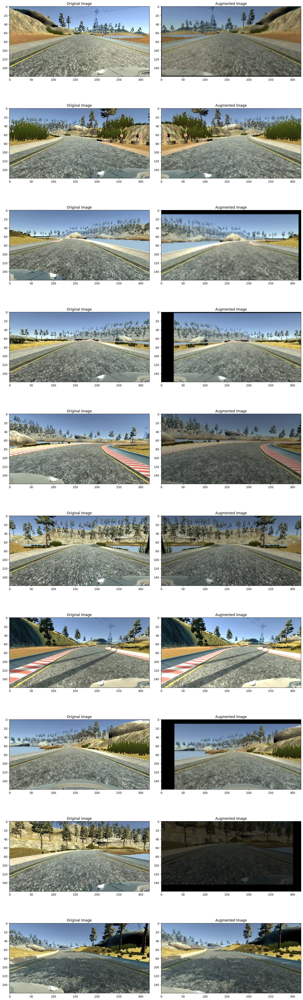

In [30]:
ncols = 2
nrows = 10
fig, axs = plt.subplots(nrows, ncols, figsize=(15, 50))
fig.tight_layout()
for i in range(10):
    rand_num = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[rand_num]
    random_steering = steerings[rand_num]
    original_image = mpimg.imread(random_image)
    augmented_image, steering_angle = random_augment(random_image, random_steering)
    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")
    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")
plt.show()

In [31]:
def img_preprocess(img):
    img = mpimg.imread(img)
    img = img[60:135, :, :]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

In [32]:
def preprocess_img_no_imread(img):
    img = img[60:135, :, :]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

In [33]:
def batch_generator(image_paths, steering_ang, batch_size, is_training):
    while True:
        batch_img = []
        batch_steering = []
        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths)-1)
            if is_training:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            im = preprocess_img_no_imread(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield np.asarray(batch_img), np.asarray(batch_steering)

Text(0.5, 1.0, 'Preprocessed Image')

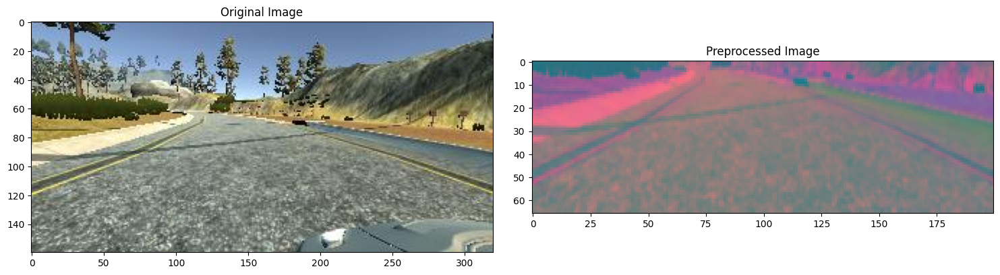

In [34]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(image)
fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title("Original Image")
axes[1].imshow(preprocessed_image)
axes[1].set_title("Preprocessed Image")

In [35]:
def nvidia_model():
    model = Sequential()
    model.add(Convolution2D(24, kernel_size=(5, 5), strides=(
        2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Convolution2D(36, kernel_size=(5, 5),
              strides=(2, 2), activation='elu'))
    model.add(Convolution2D(48, kernel_size=(5, 5),
              strides=(2, 2), activation='elu'))
    model.add(Convolution2D(64, kernel_size=(3, 3), activation='elu'))
    model.add(Convolution2D(64, kernel_size=(3, 3), activation='elu'))
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    model.add(Dense(50, activation='elu'))
    model.add(Dense(10, activation='elu'))
    model.add(Dense(1))
    optimizer = Adam(learning_rate=0.0001)
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [36]:
model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 dropout (Dropout)           (None, 1, 18, 64)         0         
                                                                 
 flatten (Flatten)           (None, 1152)              0

In [ ]:
# X_train = np.array(list(map(img_preprocess, X_train)))
# X_valid = np.array(list(map(img_preprocess, X_valid)))

# plt.imshow(X_train[random.randint(0, len(X_train)-1)])
# plt.axis('off')
# plt.show()
# print(X_train.shape)

In [37]:
history = model.fit(batch_generator(X_train, y_train, 200, 1), steps_per_epoch=200, epochs=15, validation_data=batch_generator(X_valid, y_valid, 200, 0), validation_steps=200, verbose=1, shuffle=1)

Epoch 1/15
200/200 [==============================] - 212s 1s/step - loss: 0.1310 - val_loss: 0.0635
Epoch 2/15
200/200 [==============================] - 201s 1s/step - loss: 0.0821 - val_loss: 0.0502
Epoch 3/15
200/200 [==============================] - 197s 988ms/step - loss: 0.0761 - val_loss: 0.0547
Epoch 4/15
200/200 [==============================] - 174s 872ms/step - loss: 0.0743 - val_loss: 0.0497
Epoch 5/15
200/200 [==============================] - 186s 937ms/step - loss: 0.0718 - val_loss: 0.0468
Epoch 6/15
200/200 [==============================] - 178s 896ms/step - loss: 0.0711 - val_loss: 0.0428
Epoch 7/15
200/200 [==============================] - 168s 845ms/step - loss: 0.0697 - val_loss: 0.0420
Epoch 8/15
200/200 [==============================] - 167s 838ms/step - loss: 0.0672 - val_loss: 0.0404
Epoch 9/15
200/200 [==============================] - 165s 829ms/step - loss: 0.0663 - val_loss: 0.0389
Epoch 10/15
200/200 [==============================] - 168s 844ms/step

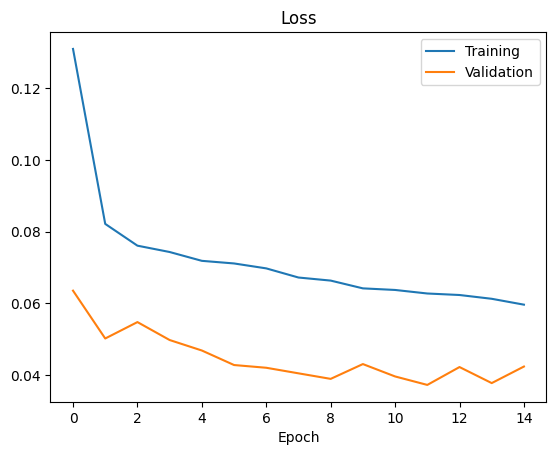

In [38]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(["Training", "Validation"])
plt.title('Loss')
plt.xlabel("Epoch")
plt.show()

In [ ]:
model.save('model.h5')
print("Model saved successfully")